## About Dataset

This dataset captures accelerometer and gyroscope data from participants performing various exercises. It reads the data from accelerometer and gyroscope sensors, capturing positional signals for different exercise categories and intensities.

- **epoch (ms)**: Timestamp of data recording.
- **Accelerometer_x/y/z**: Acceleration values from the fitness tracker.
- **Gyroscope_x/y/z**: Rotational velocity readings.
- **Participants**: Identifier for the individual.
- **Label**: Type of exercise (e.g., bench press).
- **Category**: Intensity of the exercise (e.g., heavy).
- **Set**: Set number for the recorded session.

For more details, check the [link](https://www.kaggle.com/datasets/krishujeniya/fitness-tracker-accelerometer-and-gyroscope-data).


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [5]:
# Load the data
df = pd.read_csv('../initial_data/data.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9009 entries, 0 to 9008
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   epoch (ms)       9009 non-null   object 
 1   Accelerometer_x  9009 non-null   float64
 2   Accelerometer_y  9009 non-null   float64
 3   Accelerometer_z  9009 non-null   float64
 4   Gyroscope_x      9009 non-null   float64
 5   Gyroscope_y      9009 non-null   float64
 6   Gyroscope_z      9009 non-null   float64
 7   Participants     9009 non-null   object 
 8   Label            9009 non-null   object 
 9   Category         9009 non-null   object 
 10  Set              9009 non-null   int64  
dtypes: float64(6), int64(1), object(4)
memory usage: 774.3+ KB


In [6]:
df.isna().sum()

epoch (ms)         0
Accelerometer_x    0
Accelerometer_y    0
Accelerometer_z    0
Gyroscope_x        0
Gyroscope_y        0
Gyroscope_z        0
Participants       0
Label              0
Category           0
Set                0
dtype: int64

In [7]:
df

,epoch (ms),Accelerometer_x,Accelerometer_y,Accelerometer_z,Gyroscope_x,Gyroscope_y,Gyroscope_z,Participants,Label,Category,Set
0,2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
1,2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2,2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
3,2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
4,2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...,...
9004,2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,40
9005,2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,40
9006,2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,40
9007,2019-01-20 17:33:27.600,-0.038667,-1.025667,-0.044667,-0.2318,0.2562,1.1220,E,row,medium,40


In [8]:
# settings for the plot
plt.style.use('seaborn-v0_8-deep')
plt.rcParams['figure.figsize'] = [20, 5]
plt.rcParams['figure.dpi'] = 100

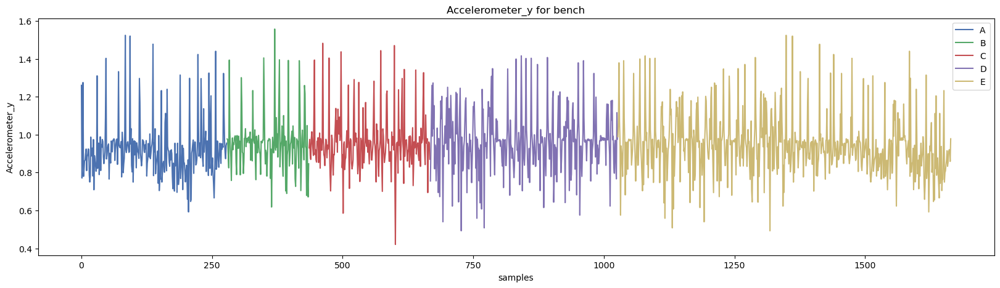

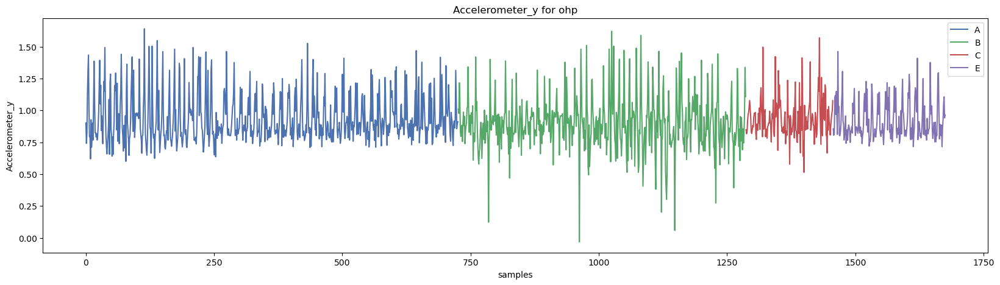

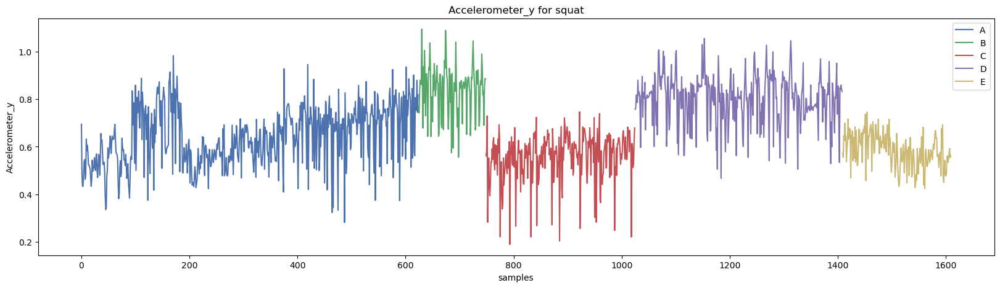

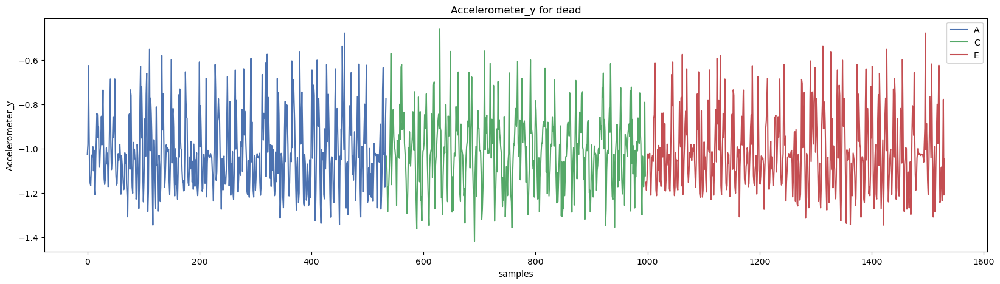

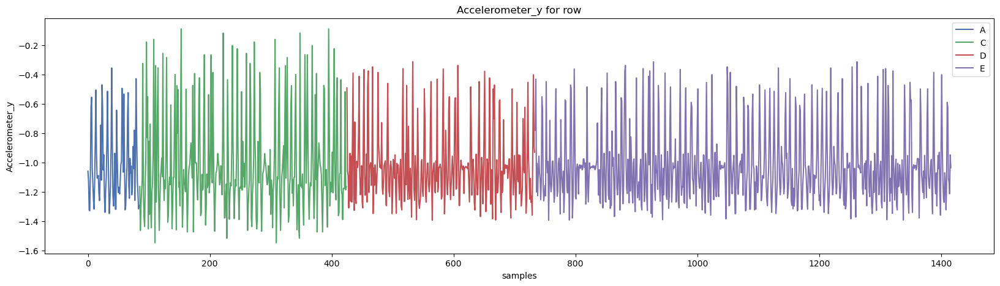

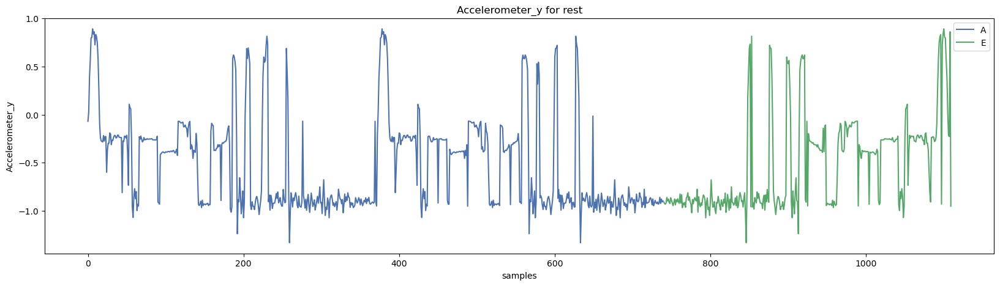

In [9]:
# comparing the participants for each exercise 
labels = df['Label'].unique()

for label in labels:
    participant_df = df.query(f'Label == "{label}"').sort_values(by=["Participants"]).reset_index()
    
    fig, ax = plt.subplots()
    participant_df.groupby(["Participants"])["Accelerometer_y"].plot(ax=ax)
    ax.set_title(f'Accelerometer_y for {label}')
    ax.set_ylabel("Accelerometer_y")
    ax.set_xlabel("samples")
    plt.legend()
    plt.show()

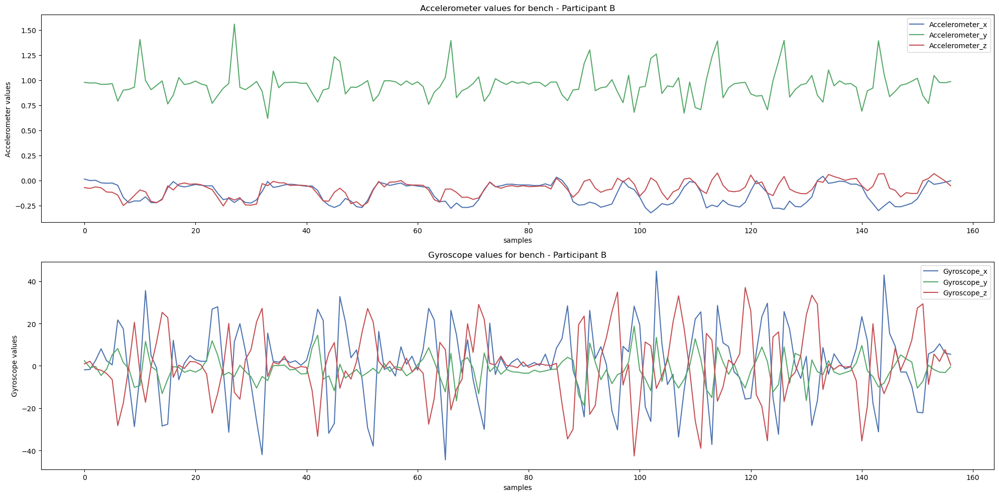

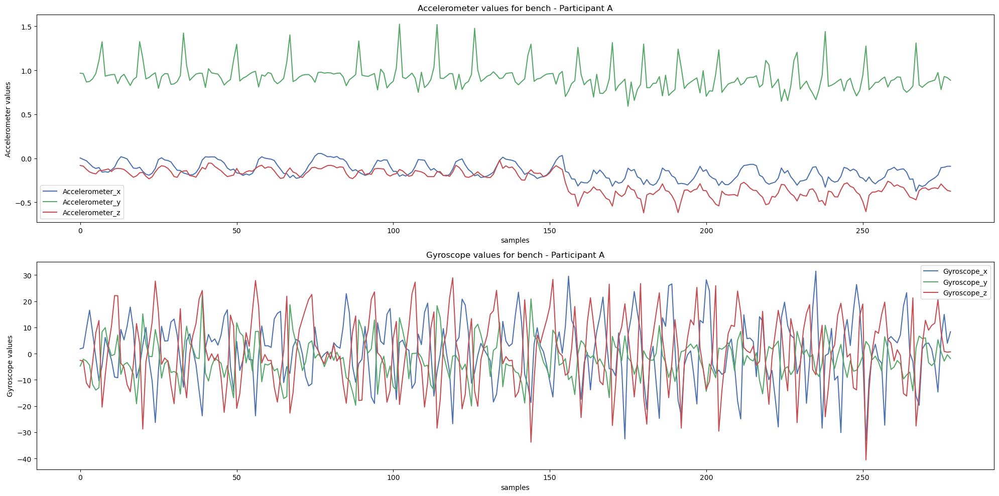

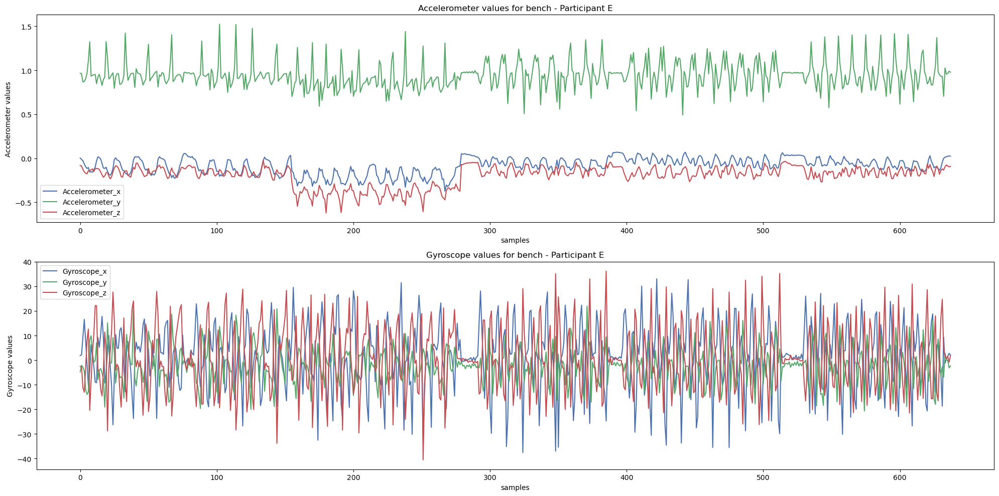

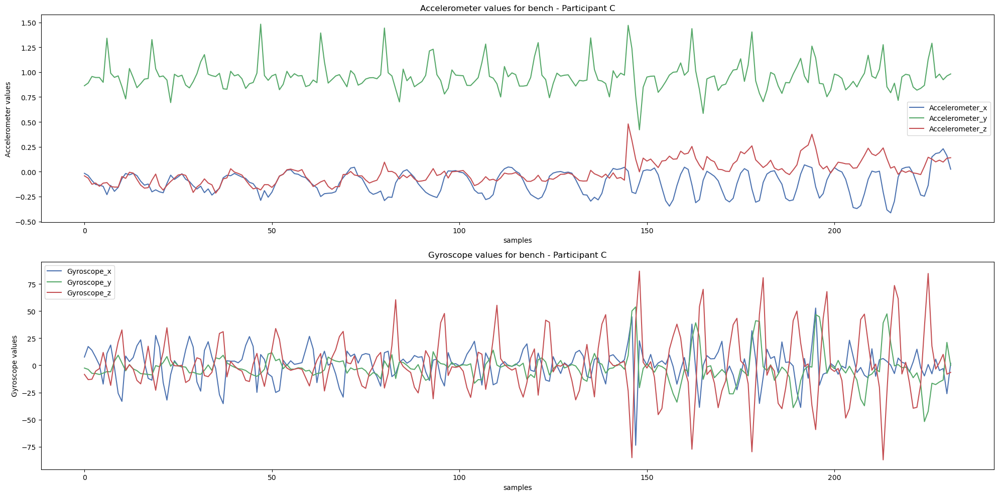

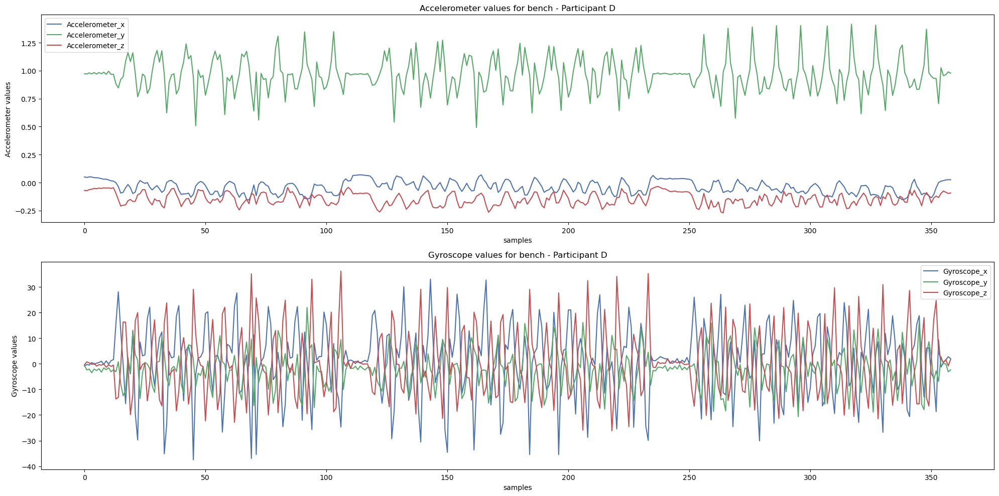

...

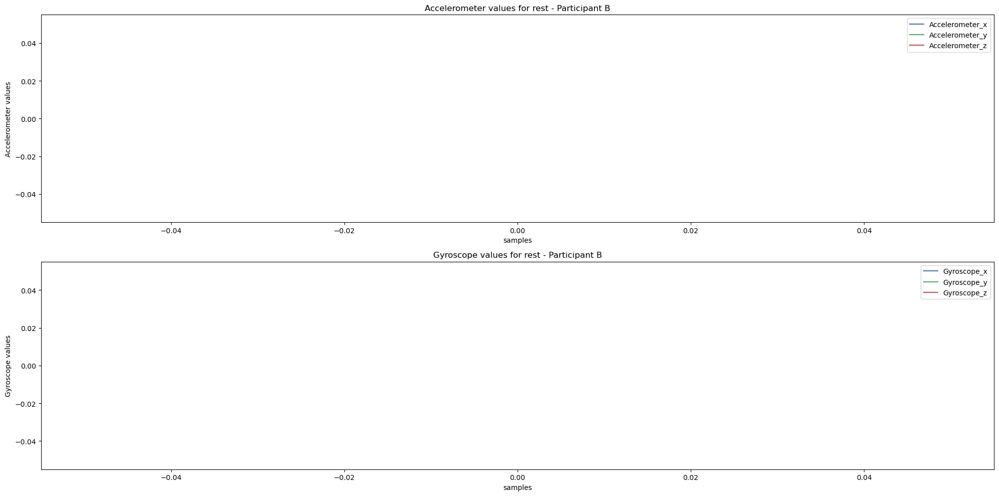

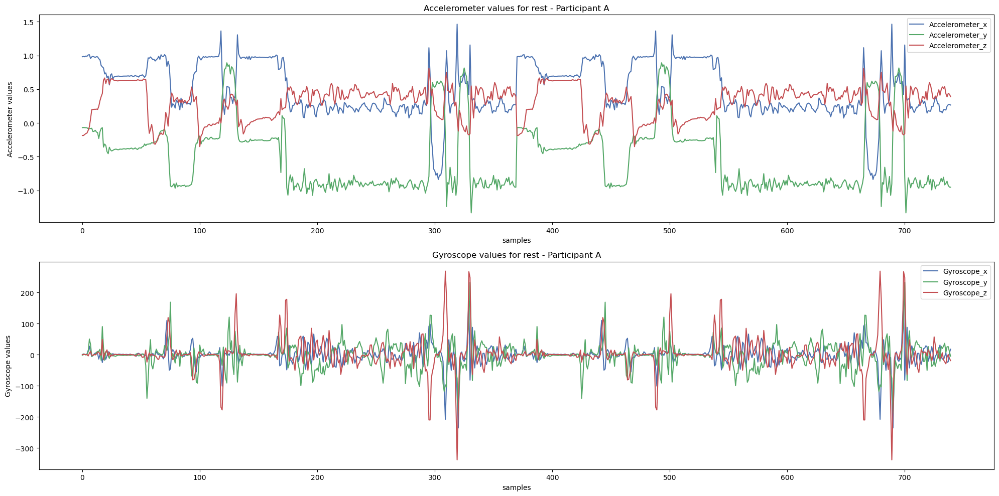

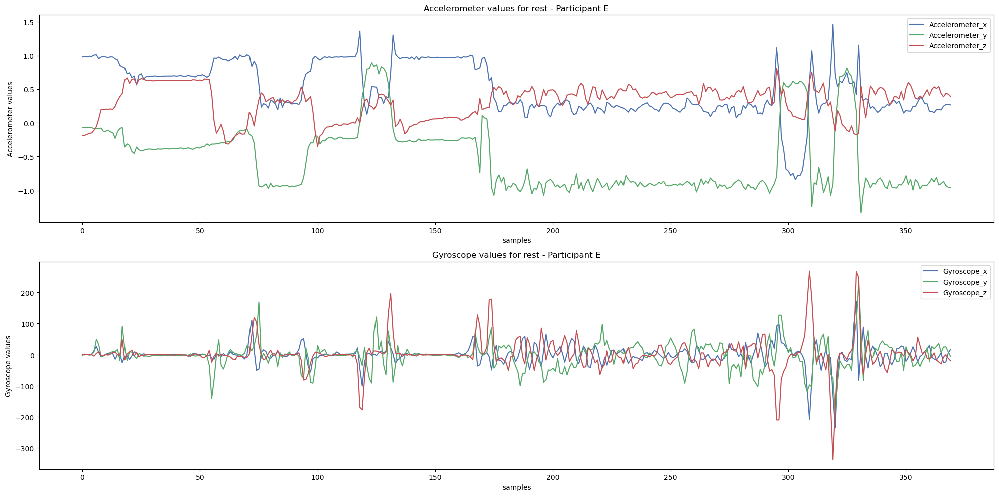

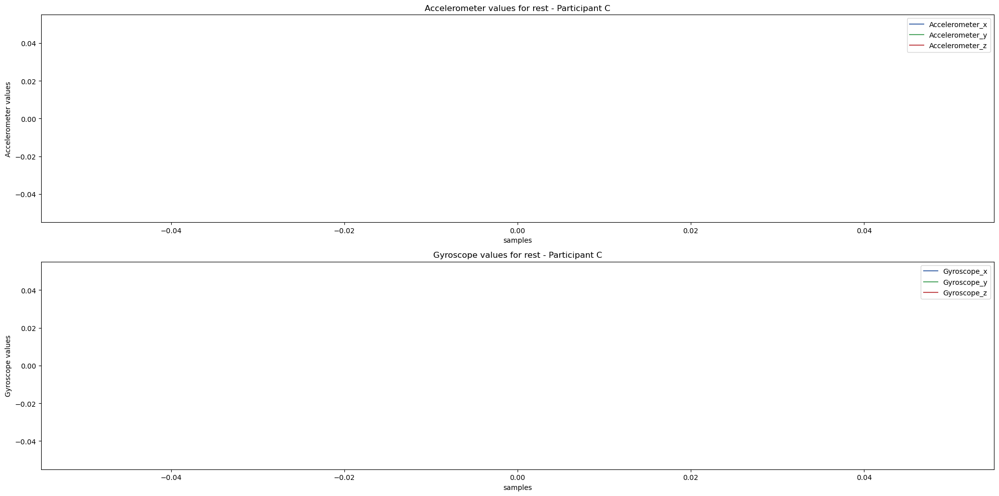

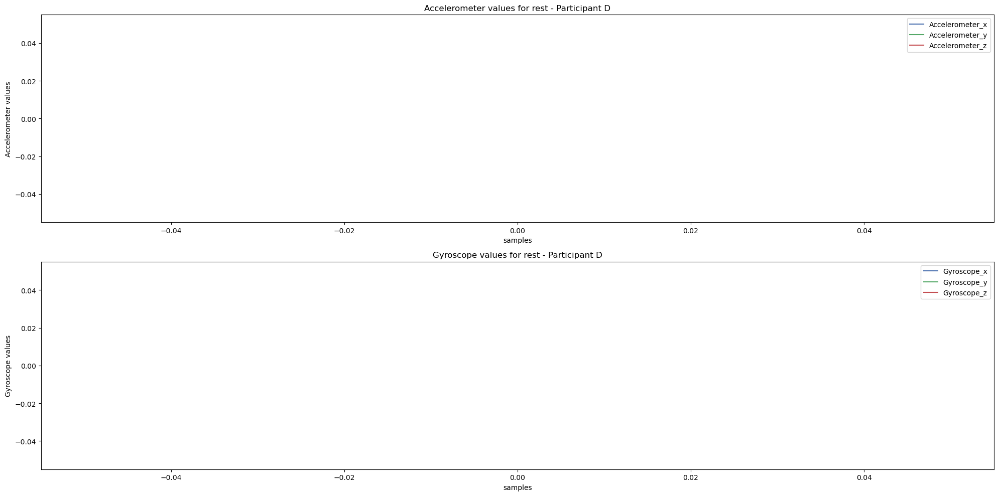

In [10]:
# plotting how the accelerometer and gyroscope values are measured for each exercise and for each participant
labels = df['Label'].unique()
participants = df['Participants'].unique()

for label in labels:
    for participant in participants:
        all_axes_df = df.query('Label == @label').query('Participants == @participant').reset_index()
        
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))
        
        all_axes_df[['Accelerometer_x', 'Accelerometer_y', 'Accelerometer_z']].plot(ax=ax1)
        ax1.set_title(f'Accelerometer values for {label} - Participant {participant}')
        ax1.set_ylabel("Accelerometer values")
        ax1.set_xlabel("samples")
        ax1.legend()
        
        all_axes_df[['Gyroscope_x', 'Gyroscope_y', 'Gyroscope_z']].plot(ax=ax2)
        ax2.set_title(f'Gyroscope values for {label} - Participant {participant}')
        ax2.set_ylabel("Gyroscope values")
        ax2.set_xlabel("samples")
        ax2.legend()
        
        plt.tight_layout()
        plt.show()